In [32]:
#importing the necessary libraries
import pandas as pd
from tinydb import TinyDB, Query
from transformers import pipeline
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline
sns.set(style='whitegrid', palette='muted', font_scale=1.2)




In [33]:
df_hotel_reviews = pd.read_csv("/Users/yasminesarraj/Documents/GitHub/MLOPS-assignments/Assignment_1/Hotel_Reviews.csv.zip")
df_hotel_reviews.head()

,Hotel_Address,Additional_Number_of_Scoring,Review_Date,Average_Score,Hotel_Name,Reviewer_Nationality,Negative_Review,Review_Total_Negative_Word_Counts,Total_Number_of_Reviews,Positive_Review,Review_Total_Positive_Word_Counts,Total_Number_of_Reviews_Reviewer_Has_Given,Reviewer_Score,Tags,days_since_review,lat,lng
0,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,8/3/2017,7.7,Hotel Arena,Russia,I am so angry that i made this post available...,397,1403,Only the park outside of the hotel was beauti...,11,7,2.9,"[' Leisure trip ', ' Couple ', ' Duplex Double...",0 days,52.360576,4.915968
1,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,8/3/2017,7.7,Hotel Arena,Ireland,No Negative,0,1403,No real complaints the hotel was great great ...,105,7,7.5,"[' Leisure trip ', ' Couple ', ' Duplex Double...",0 days,52.360576,4.915968
2,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,7/31/2017,7.7,Hotel Arena,Australia,Rooms are nice but for elderly a bit difficul...,42,1403,Location was good and staff were ok It is cut...,21,9,7.1,"[' Leisure trip ', ' Family with young childre...",3 days,52.360576,4.915968
3,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,7/31/2017,7.7,Hotel Arena,United Kingdom,My room was dirty and I was afraid to walk ba...,210,1403,Great location in nice surroundings the bar a...,26,1,3.8,"[' Leisure trip ', ' Solo traveler ', ' Duplex...",3 days,52.360576,4.915968
4,s Gravesandestraat 55 Oost 1092 AA Amsterdam ...,194,7/24/2017,7.7,Hotel Arena,New Zealand,You When I booked with your company on line y...,140,1403,Amazing location and building Romantic setting,8,3,6.7,"[' Leisure trip ', ' Couple ', ' Suite ', ' St...",10 days,52.360576,4.915968


In [19]:
print(f"{df_hotel_reviews.shape[0]} rows, {df_hotel_reviews.shape[1]} columns")

515738 rows, 17 columns


In [20]:
df_hotel_reviews.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 515738 entries, 0 to 515737
Data columns (total 17 columns):
 #   Column                                      Non-Null Count   Dtype  
---  ------                                      --------------   -----  
 0   Hotel_Address                               515738 non-null  object 
 1   Additional_Number_of_Scoring                515738 non-null  int64  
 2   Review_Date                                 515738 non-null  object 
 3   Average_Score                               515738 non-null  float64
 4   Hotel_Name                                  515738 non-null  object 
 5   Reviewer_Nationality                        515738 non-null  object 
 6   Negative_Review                             515738 non-null  object 
 7   Review_Total_Negative_Word_Counts           515738 non-null  int64  
 8   Total_Number_of_Reviews                     515738 non-null  int64  
 9   Positive_Review                             515738 non-null  object 
 

Here we just get rid of some missings and have a look at the data

In [34]:
#We'll get rid of the missing lat and long data as we might want to add a map 
df_hotel_reviews.isnull().sum()

Hotel_Address                                    0
Additional_Number_of_Scoring                     0
Review_Date                                      0
Average_Score                                    0
Hotel_Name                                       0
Reviewer_Nationality                             0
Negative_Review                                  0
Review_Total_Negative_Word_Counts                0
Total_Number_of_Reviews                          0
Positive_Review                                  0
Review_Total_Positive_Word_Counts                0
Total_Number_of_Reviews_Reviewer_Has_Given       0
Reviewer_Score                                   0
Tags                                             0
days_since_review                                0
lat                                           3268
lng                                           3268
dtype: int64

In [35]:
#Delete missings:
df_hotel_reviews_clean = df_hotel_reviews.dropna()

print(f'We reduced the dataset by dropping the missings by: {round((len(df_hotel_reviews)-len(bank_data_clean))/len(df_hotel_reviews)*100, 3)} %.')

We reduced the dataset by dropping the missings by: 0.634 %.


In [36]:
fig = px.histogram(df_hotel_reviews_clean, x="Reviewer_Score", title='Review Score Distribution', nbins=20, text_auto=True)
fig.show()

In [37]:
print(f"Total Positive word count {df_hotel_reviews_clean.Review_Total_Positive_Word_Counts.sum()}, Total negative word count {df_hotel_reviews_clean.Review_Total_Negative_Word_Counts.sum()}")

Total Positive word count 9104056, Total negative word count 9502149


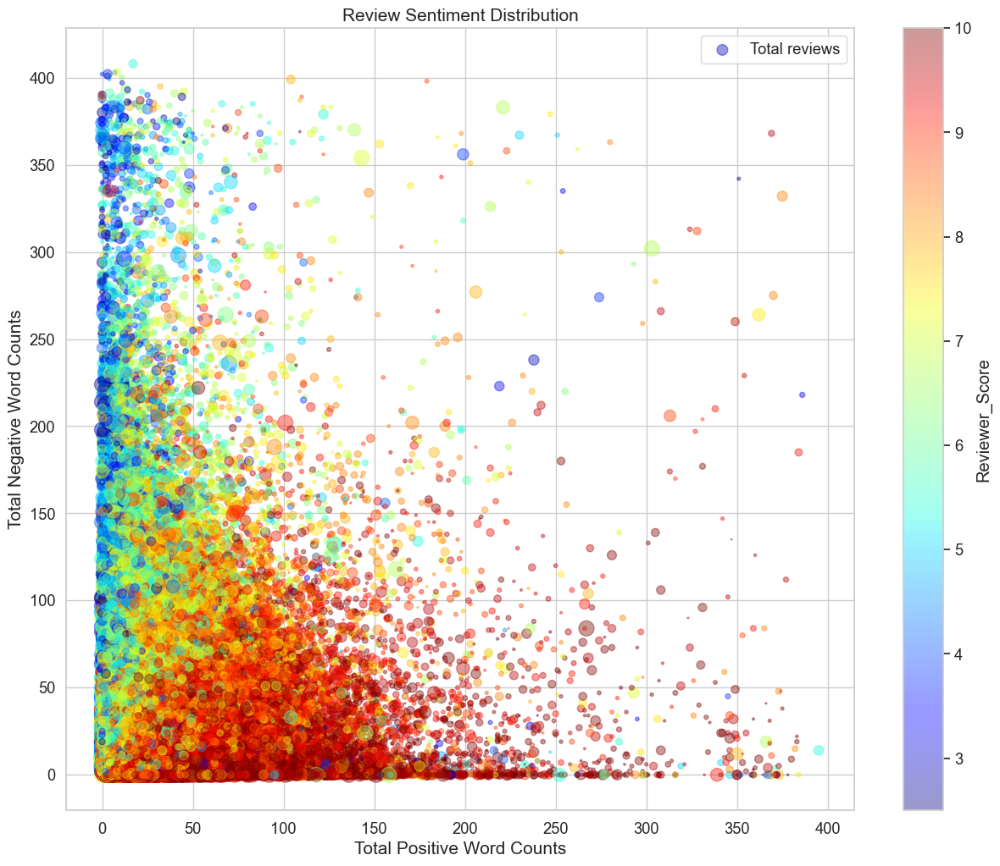

In [39]:
df_hotel_reviews.plot(kind='scatter', 
                      x='Review_Total_Positive_Word_Counts', 
                      y='Review_Total_Negative_Word_Counts', 
                      label='Total reviews',
             s=df_hotel_reviews.Total_Number_of_Reviews/100,
             c='Reviewer_Score',
             cmap='jet', 
             colorbar=True, 
             alpha=0.4, figsize=(15,12),
             sharex=False,
             )
font_size = 15
plt.title("Review Sentiment Distribution",  fontsize=font_size)
plt.xlabel("Total Positive Word Counts", fontsize=font_size)
plt.ylabel("Total Negative Word Counts",  fontsize=font_size)
plt.legend()
plt.show()

From the above graph, we can infer that -

The value of Total positive word counts is lower than total negative word counts
Although the distribution of Positive Review seems to dominate negative reviews, the distribution of Negative Review has higher negative word count in general

In [40]:
# Top 20
df_hotel_reviews_clean.Reviewer_Nationality.value_counts()[:20]

 United Kingdom               244457
 United States of America      35196
 Australia                     21540
 Ireland                       14746
 United Arab Emirates          10176
 Saudi Arabia                   8914
 Netherlands                    8706
 Switzerland                    8616
 Germany                        7843
 Canada                         7813
 France                         7233
 Israel                         6536
 Italy                          6061
 Belgium                        5991
 Turkey                         5383
 Kuwait                         4904
 Spain                          4694
 Romania                        4424
 Russia                         3844
 South Africa                   3795
Name: Reviewer_Nationality, dtype: int64

In [41]:
fig = px.histogram(df_hotel_reviews_clean, x="Average_Score", title='Review Average Score Distribution')
fig.show()

We know some comments appear as No Negative/No Positive comments so we will merge and clean them up before putting them in the TinyDB database and applying our sentiment analysis from a transformer model.

In [43]:
df_hotel_reviews_clean["review"] = df_hotel_reviews_clean["Negative_Review"] + df_hotel_reviews_clean["Positive_Review"]

/var/folders/ss/lhx9lhjx3wn1dkd8thzyx0w40000gn/T/ipykernel_71861/501337041.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [45]:

df_hotel_reviews_clean["review"] = df_hotel_reviews_clean["review"].apply(lambda x: x.replace("No Negative", "").replace("No Positive", ""))

/var/folders/ss/lhx9lhjx3wn1dkd8thzyx0w40000gn/T/ipykernel_71861/1031378366.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [46]:
df_hotel_reviews_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 512470 entries, 0 to 515737
Data columns (total 18 columns):
 #   Column                                      Non-Null Count   Dtype  
---  ------                                      --------------   -----  
 0   Hotel_Address                               512470 non-null  object 
 1   Additional_Number_of_Scoring                512470 non-null  int64  
 2   Review_Date                                 512470 non-null  object 
 3   Average_Score                               512470 non-null  float64
 4   Hotel_Name                                  512470 non-null  object 
 5   Reviewer_Nationality                        512470 non-null  object 
 6   Negative_Review                             512470 non-null  object 
 7   Review_Total_Negative_Word_Counts           512470 non-null  int64  
 8   Total_Number_of_Reviews                     512470 non-null  int64  
 9   Positive_Review                             512470 non-null  object 
 

In [47]:
#Save the final dataset:
#df_hotel_reviews_clean.to_csv("final_data.csv")